In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import tensorflow as tf
from matplotlib import pyplot as plt
from helpers import *

import style_transfer

config = tf.ConfigProto()

def reset():
    tf.reset_default_graph()
    config = tf.ConfigProto()
    config.gpu_options.per_process_gpu_memory_fraction = 0.4

# Style Transfer Test

## With normal style transfer

In [2]:
import tensorflow as tf
import vgg19

In [75]:
tf.reset_default_graph()
sess = tf.Session()

vgg = vgg19.Vgg19(VGG_PATH + 'vgg19.npy')
vgg_shape = [1, None, None, 3]

images = tf.placeholder("float", vgg_shape, name="images")
vgg.build(images)


In [90]:
im_content = load_image2("data/catndogs/1.jpg", width=448)
im_style = load_image2("data/catndogs/2.jpg", height=im_content.shape[0], width=im_content.shape[1])

In [91]:
dict_content = eval_layers(sess, im_content, vgg, ["conv4_1", "conv4_4", "conv3_1", "conv5_1", "conv2_1", "conv5_4"])
layer_1 = dict_content.get("conv4_4")
layer_141 = dict_content.get("conv4_1")
layer_131 = dict_content.get("conv3_1")
layer_151 = dict_content.get("conv5_1")
layer_121 = dict_content.get("conv2_1")
layer_154 = dict_content.get("conv5_4")


dict_content = eval_layers(sess, im_style, vgg, ["conv4_1", "conv4_4", "conv3_1", "conv5_1", "conv2_1", "conv5_4"])
layer_2 = dict_content.get("conv4_4")
layer_241 = dict_content.get("conv4_1")
layer_231 = dict_content.get("conv3_1")
layer_251 = dict_content.get("conv5_1")
layer_221 = dict_content.get("conv2_1")
layer_254 = dict_content.get("conv5_4")


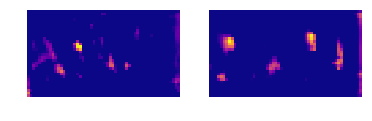

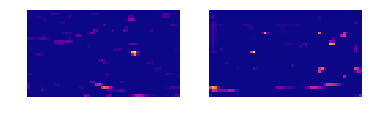

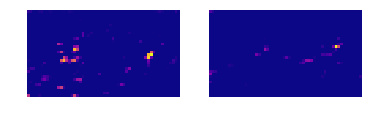

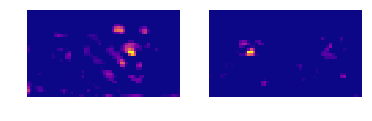

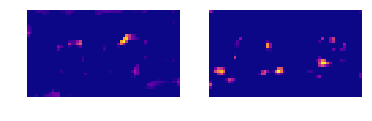

...

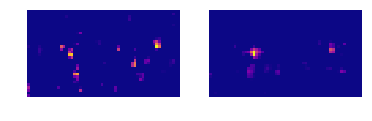

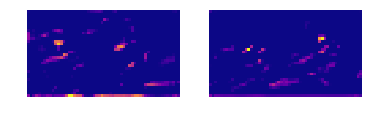

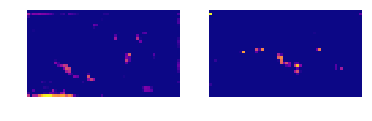

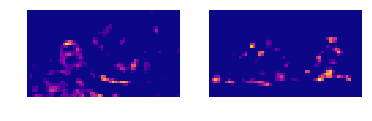

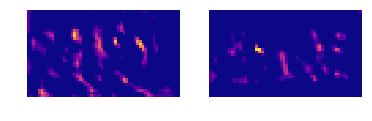

In [92]:
for k in range(0, 20):
    plt.figure(figsize=(6,6))
    ax = plt.subplot(2,2,1)
    ax.imshow(layer_1[0][:,:,k], cmap="plasma", interpolation="nearest")
    plt.axis('off')
    ax = plt.subplot(2,2,2)
    ax.imshow(layer_2[0][:,:,k], cmap="plasma", interpolation="nearest")
    plt.axis('off')

In [93]:
s = np.sum(layer_1, axis=3)
d = np.sum(layer_2, axis=3)

88564.969

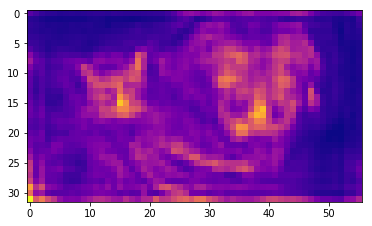

In [94]:
plt.imshow(s[0], cmap="plasma")
s.max()

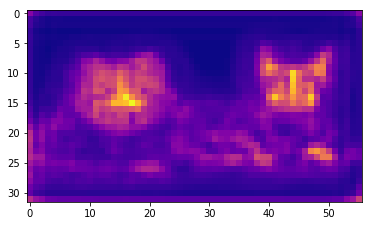

In [95]:
plt.imshow(d[0], cmap="plasma")

In [96]:
A = compute_affinity_matrix(layer_154, layer_254)


(-0.5, 447.5, 447.5, -0.5)

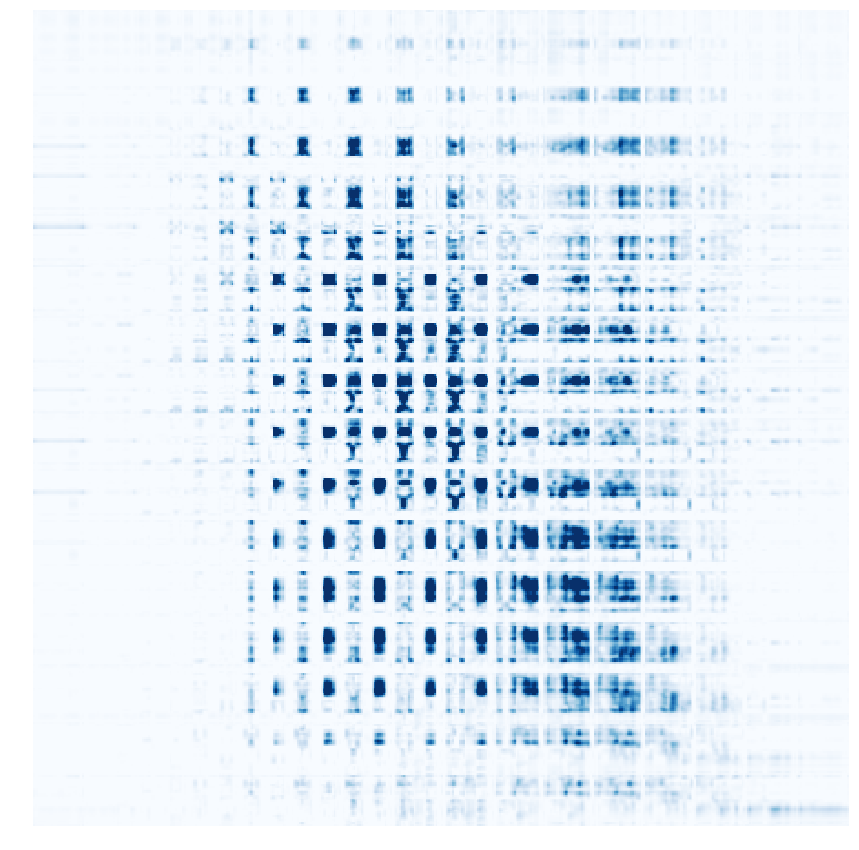

In [97]:
'''plt.figure(figsize=(15,15))
plt.imshow(A, cmap="Blues")
plt.axis("off")
'''

plt.figure(figsize=(15,15))
plt.imshow(A / A.max(), cmap="Blues", vmax=0.075)
plt.axis("off")


In [122]:
normalized = True
K=10
L,R = get_masks(K, A, layer_154.shape[1:3], layer_254.shape[1:3], normalize=normalized)

L_all = L.sum(axis=0)
#L_mean = L_all.mean()
#L_std = L_all.std()
L_all /= L_all.max()
L_orphan = 1 - L_all
L = np.concatenate((L, L_orphan[None, ...]))

R_all = R.sum(axis=0)
R_all /= R_all.max()
R_orphan = 1 - R_all
R = np.concatenate((R, R_orphan[None, ...]))



Computing 10 masks


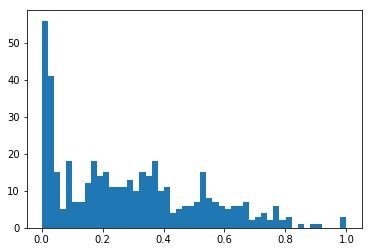

In [109]:
plt.hist(L_all.flatten(), bins=50);

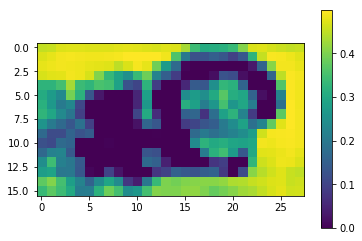

In [121]:
plt.imshow(np.maximum((1 - L_all - 0.5), 0) )
plt.colorbar()

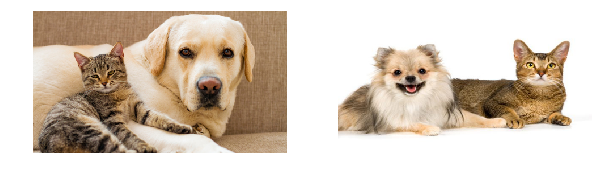

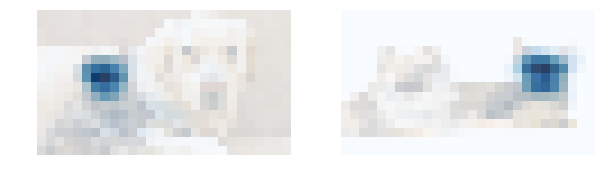

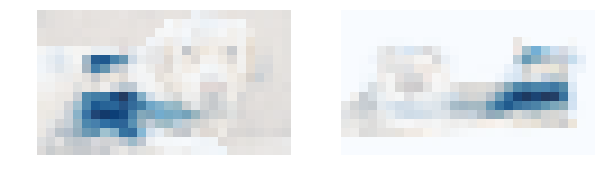

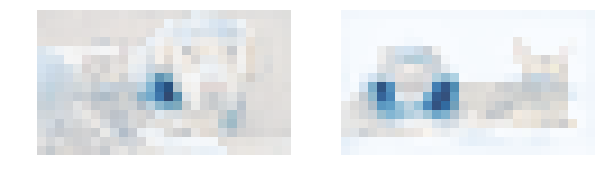

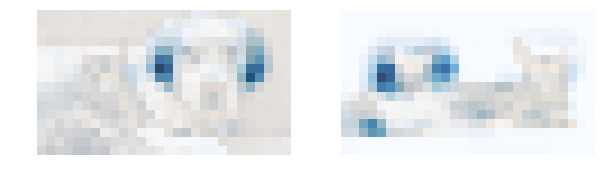

...

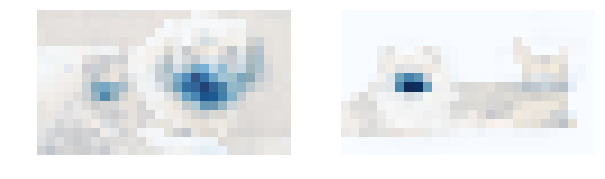

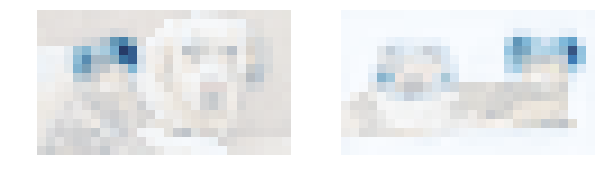

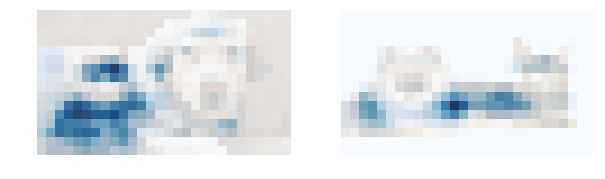

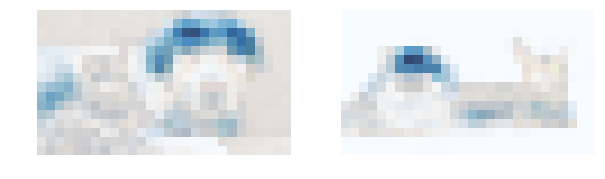

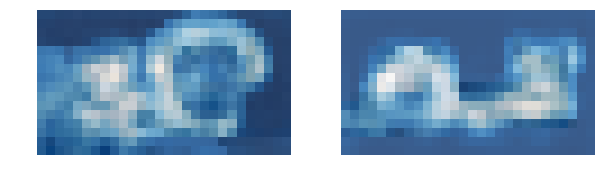

In [101]:
show_masks(im_content, im_style, L, R, K+1, normalized=normalized, show_original=True)

In [59]:
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import unary_from_softmax
import numpy as np
import scipy
import scipy.ndimage


def refine_mask(mask_in=None):
    mask_in = mask_in.astype(np.uint8)
    mask_out = scipy.ndimage.morphology.binary_fill_holes(mask_in)  ## fill in the holes
    return mask_out

crf_params = {}
crf_params['sxy'] = (30, 30)
crf_params['srgb'] = (3, 3, 3)
crf_params['compat'] = 3
crf_params['d_infer'] = 5

def dcrf_refine(img, mask):
    img_sz = img.shape[0:2]
    if img_sz[0] != mask.shape[0]:
        mask = skimage.transform.resize(mask, img_sz, mode='constant', order=1)
        plt.figure()
        plt.imshow(mask)

    ## refine with CRF
    labels_c = mask[None]  # labels.reshape((1,img_sz[0],img_sz[1]))
    labels_c = np.concatenate([1 - labels_c, labels_c], axis=0)
    d = dcrf.DenseCRF2D(img_sz[1], img_sz[0], 2)
    U = unary_from_softmax(labels_c, scale=0.6)
    d.setUnaryEnergy(U)
    
    d.addPairwiseBilateral(sxy=crf_params['sxy'], srgb=crf_params['srgb'], rgbim=img.astype(np.uint8),
                           compat=crf_params['compat'],
                           kernel=dcrf.DIAG_KERNEL, normalization=dcrf.NORMALIZE_SYMMETRIC)
    Q = d.inference(crf_params['d_infer'])
    Q = np.array(Q)[0]
    labels_c = refine_mask(Q.reshape(img_sz) < 0.5)
    return labels_c

In [60]:
threshold = 0.5
#Lt = np.where(L > threshold, 1.0, 0.0)
#Rt = np.where(R > threshold, 1.0, 0.0)

Lt = np.where(L > threshold, L, 0.0)
Rt = np.where(R > threshold, R, 0.0)


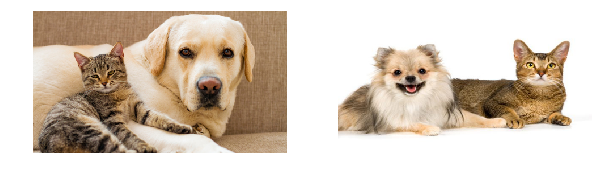

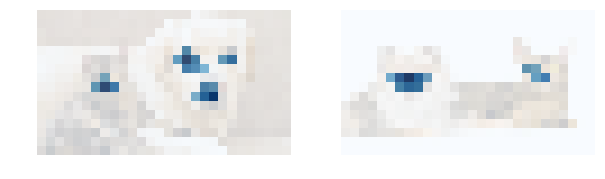

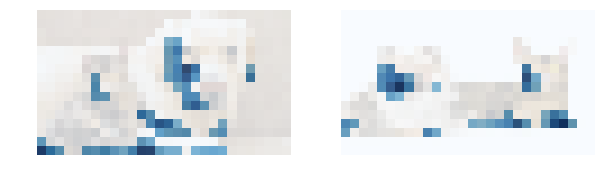

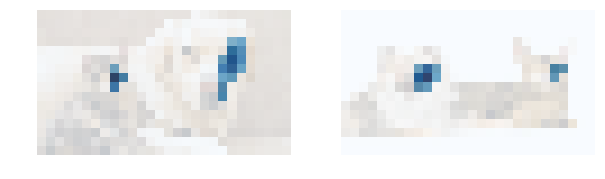

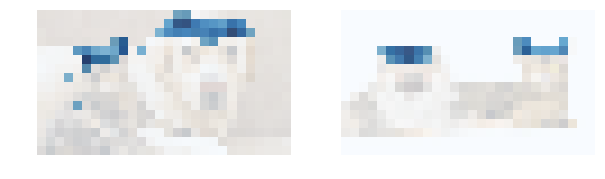

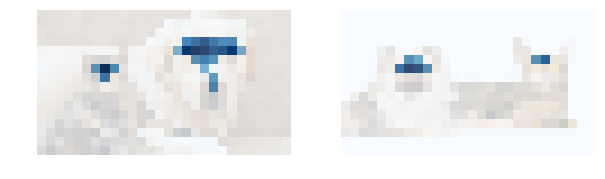

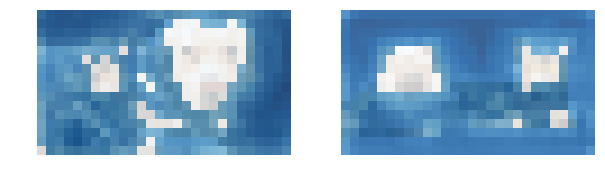

In [61]:
show_masks(im_content, im_style, Lt, Rt, K+1, normalized=normalized, show_original=True)

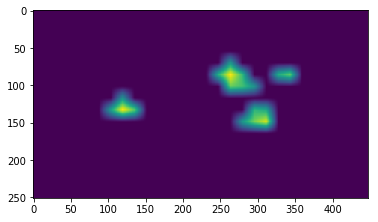

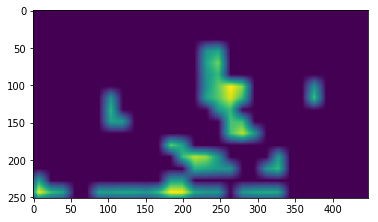

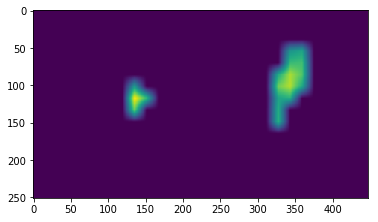

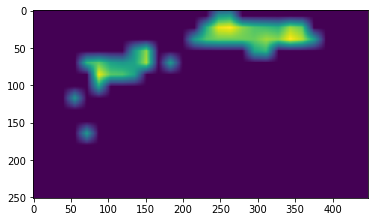

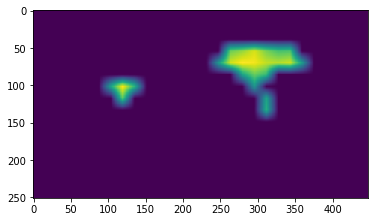

...

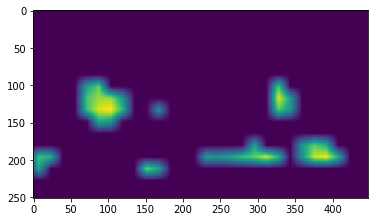

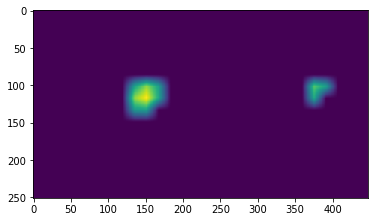

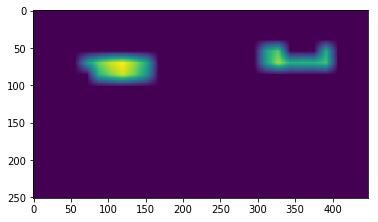

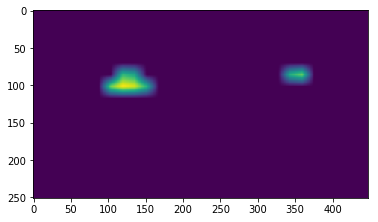

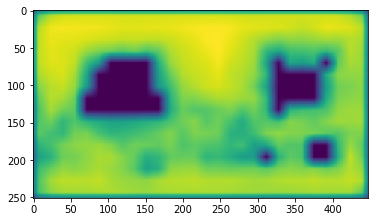

In [62]:
L2 = [dcrf_refine(im_content*255, l) for l in Lt]
R2 = [dcrf_refine(im_style*255, r) for r in Rt]

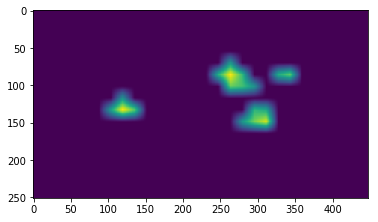

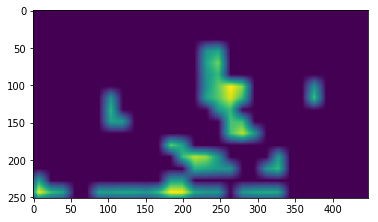

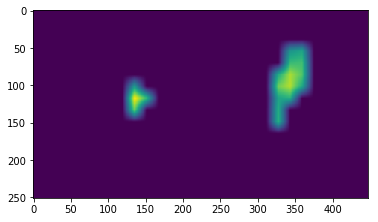

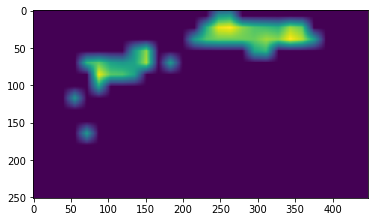

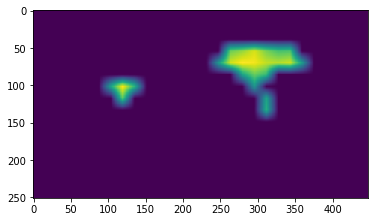

...

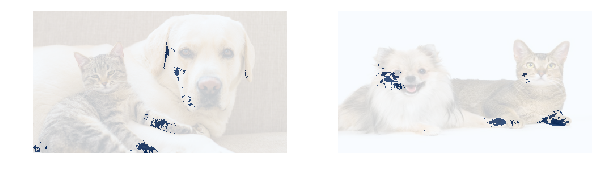

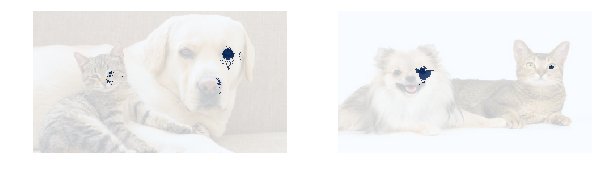

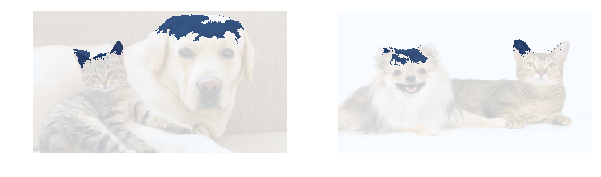

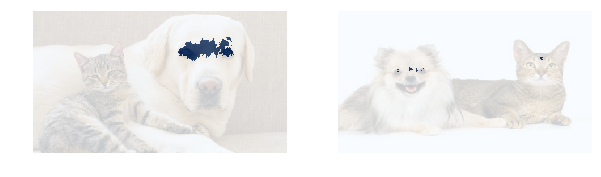

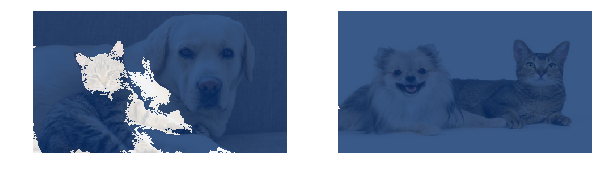

In [63]:
L2 = [dcrf_refine(im_content*255, l) for l in Lt]
R2 = [dcrf_refine(im_style*255, r) for r in Rt]
show_masks(im_content, im_style, L2, R2, K+1, normalized=normalized, show_original=True)

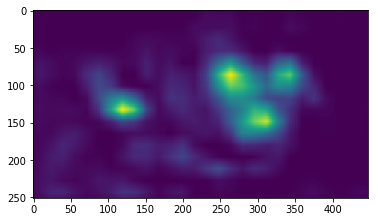

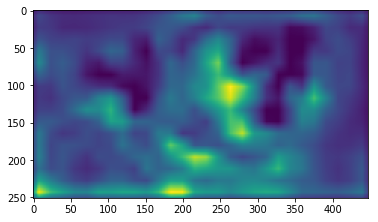

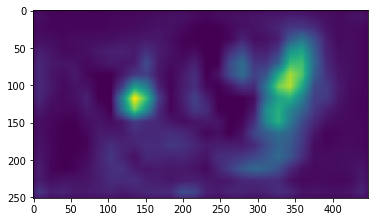

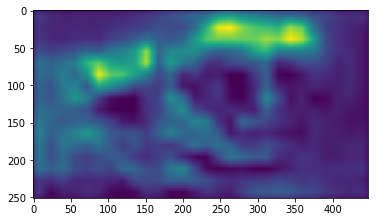

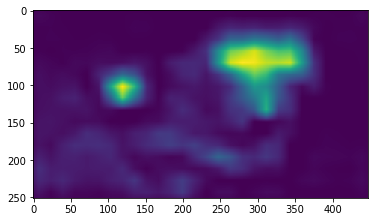

...

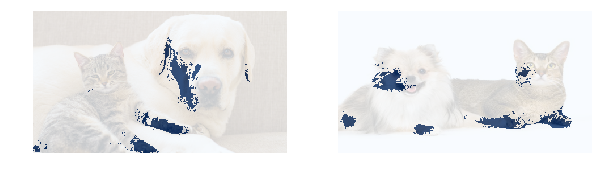

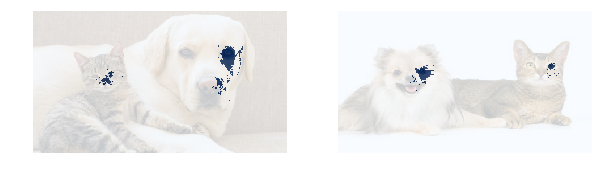

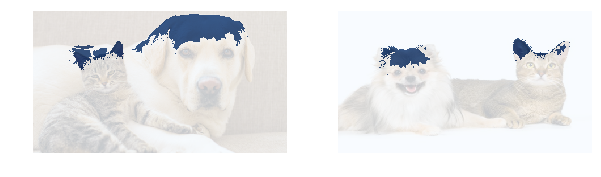

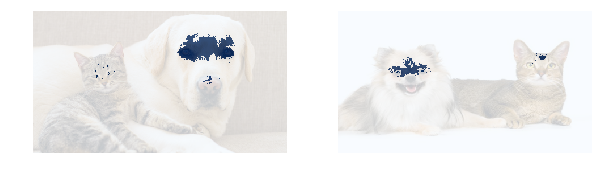

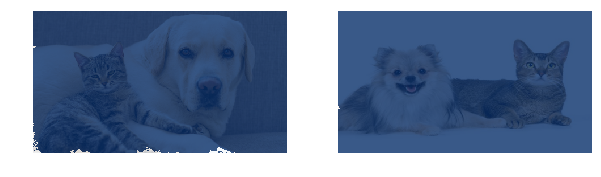

In [64]:
L2 = [dcrf_refine(im_content*255, l) for l in L]
R2 = [dcrf_refine(im_style*255, r) for r in R]
show_masks(im_content, im_style, L2, R2, K+1, normalized=normalized, show_original=True)

Computing 15 masks


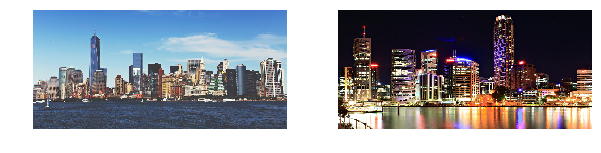

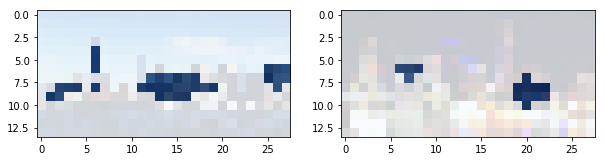

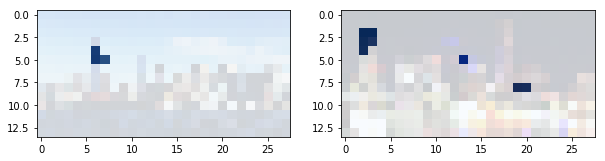

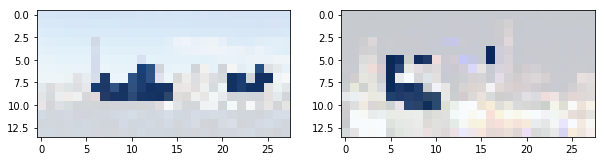

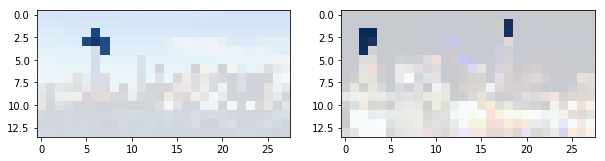

...

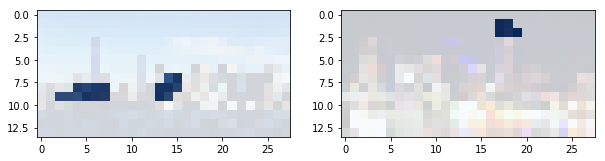

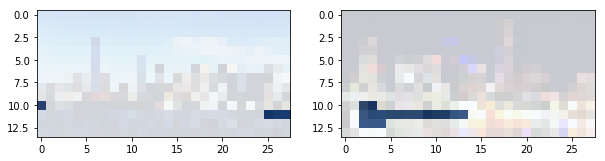

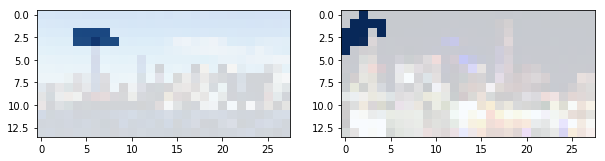

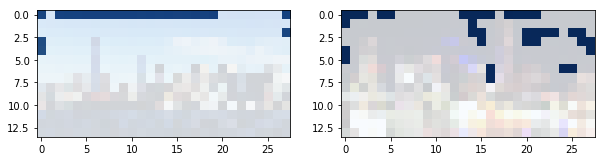

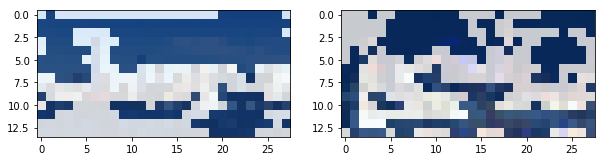

(1, 27, 56, 512)
Start Training
Iteration 0 / 200
Content loss: 0.0
Style loss: 107188648.0
Affine loss: 0.0
Tv loss: 0.0
Iteration 100 / 200
Content loss: 402997.59375
Style loss: 3954844.5
Affine loss: 0.0
Tv loss: 0.0
Iteration 200 / 200
Content loss: 420066.40625
Style loss: 3124850.5
Affine loss: 0.0
Tv loss: 0.0
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
  Objective function value: 3538560.750000
  Number of iterations: 201
  Number of functions evaluations: 203


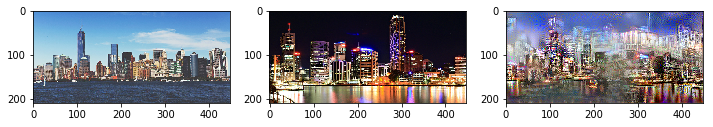

In [28]:
im_content = load_image2("data/city/7.jpg", width=448).astype("float32")
im_style = load_image2("data/city/5.jpg", height=im_content.shape[0], width=im_content.shape[1]).astype("float32")
reset()

with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_2"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 200, 0.8, K=15, orphan=True, normalize=True, use_dcrf=False, matting_loss=0, tv_loss=0, debug=True)

Computing 15 masks


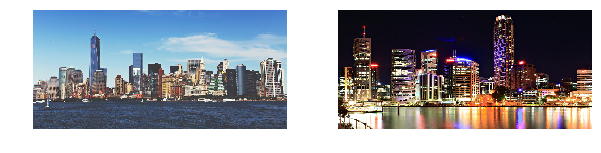

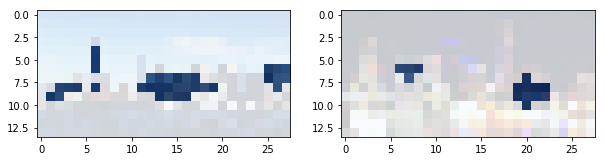

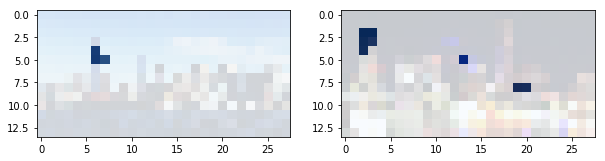

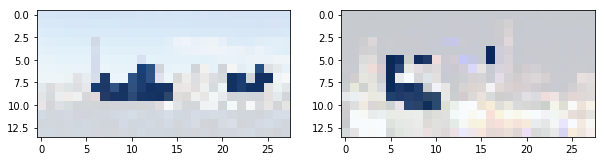

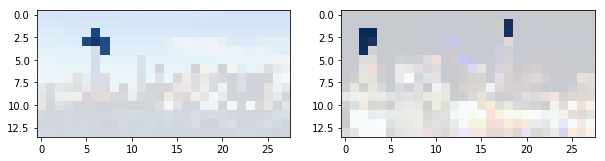

...

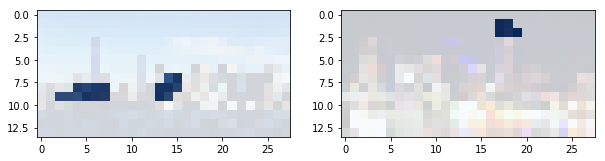

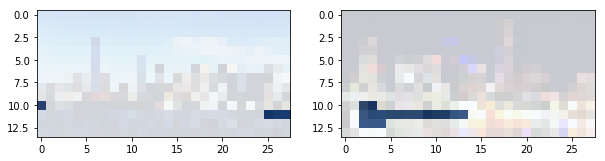

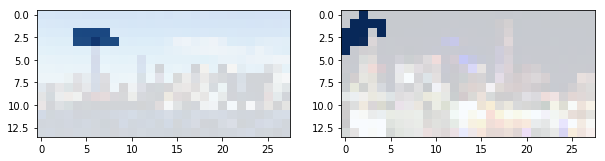

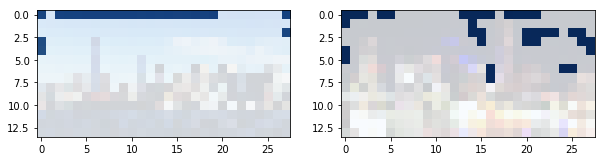

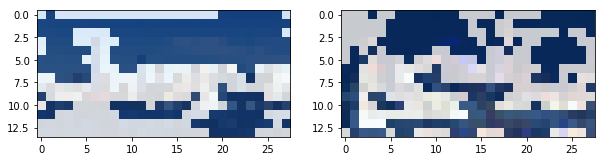

(1, 27, 56, 512)
Start Training
Iteration 0 / 200
Content loss: 0.0
Style loss: 107188640.0
Affine loss: 37036.25
Tv loss: 283673.9375
Iteration 100 / 200
Content loss: 298193.96875
Style loss: 8890767.0
Affine loss: 3700051.75
Tv loss: 446103.28125
Iteration 200 / 200
Content loss: 309813.34375
Style loss: 8225980.5
Affine loss: 3519211.5
Tv loss: 440871.53125
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
  Objective function value: 12488405.000000
  Number of iterations: 201
  Number of functions evaluations: 203


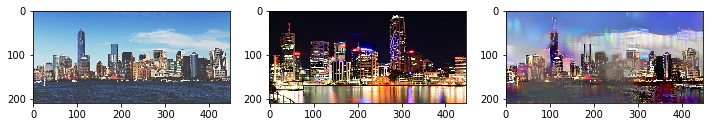

In [33]:
im_content = load_image2("data/city/7.jpg", width=448).astype("float32")
im_style = load_image2("data/city/5.jpg", height=im_content.shape[0], width=im_content.shape[1]).astype("float32")
reset()

with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_2"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 200, 0.8, K=15, orphan=True, normalize=True, use_dcrf=False, matting_loss=1000000000, tv_loss=100, debug=True)

(1, 27, 56, 512)
Start Training
Iteration 0 / 1000
Content loss: 0.0
Style loss: 4187132928.0
Affine loss: 0.0
Tv loss: 0.0
Iteration 100 / 1000
Content loss: 357893.46875
Style loss: 22339504.0
Affine loss: 0.0
Tv loss: 0.0
Iteration 200 / 1000
Content loss: 392555.46875
Style loss: 11482439.0
Affine loss: 0.0
Tv loss: 0.0
Iteration 300 / 1000
Content loss: 405174.5625
Style loss: 7990433.5
Affine loss: 0.0
Tv loss: 0.0
Iteration 400 / 1000
Content loss: 411465.125
Style loss: 6168525.5
Affine loss: 0.0
Tv loss: 0.0
Iteration 500 / 1000
Content loss: 416207.46875
Style loss: 4963154.5
Affine loss: 0.0
Tv loss: 0.0
Iteration 600 / 1000
Content loss: 420565.59375
Style loss: 4030872.75
Affine loss: 0.0
Tv loss: 0.0
Iteration 700 / 1000
Content loss: 423346.75
Style loss: 3304642.25
Affine loss: 0.0
Tv loss: 0.0
Iteration 800 / 1000
Content loss: 425228.40625
Style loss: 2798039.5
Affine loss: 0.0
Tv loss: 0.0
Iteration 900 / 1000
Content loss: 427291.15625
Style loss: 2424425.0
Affine l

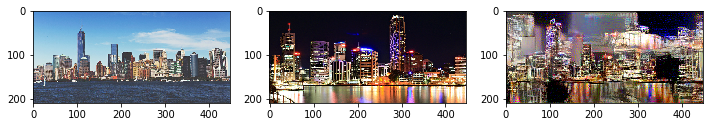

In [21]:
im_content = load_image2("data/city/7.jpg", width=448).astype("float32")
im_style = load_image2("data/city/5.jpg", height=im_content.shape[0], width=im_content.shape[1]).astype("float32")
reset()

with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_2"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 1000, 0.8, K=0, orphan=True, normalize=True, use_dcrf=False, matting_loss=0, tv_loss=0, debug=True)

Computing 4 masks


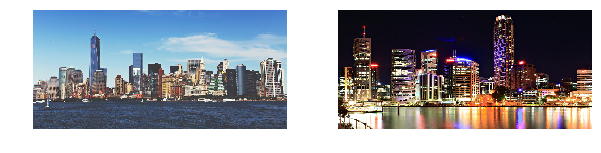

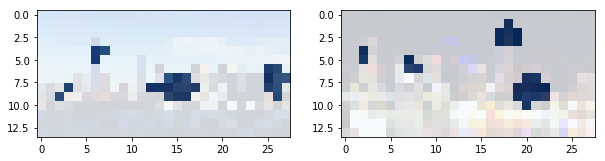

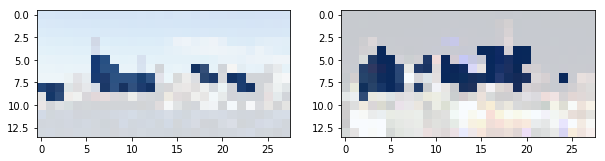

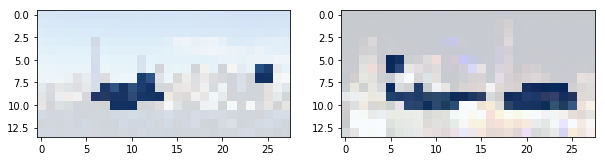

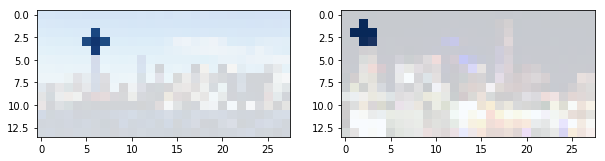

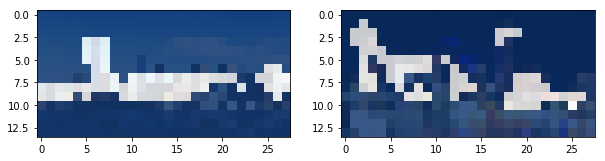

(1, 27, 56, 512)
Start Training
Iteration 0 / 1000
Content loss: 0.0
Style loss: 856419008.0
Affine loss: 0.0
Tv loss: 0.0
Iteration 100 / 1000
Content loss: 402759.125
Style loss: 8011678.0
Affine loss: 0.0
Tv loss: 0.0
Iteration 200 / 1000
Content loss: 427796.0
Style loss: 4783997.5
Affine loss: 0.0
Tv loss: 0.0
Iteration 300 / 1000
Content loss: 439351.59375
Style loss: 3640381.0
Affine loss: 0.0
Tv loss: 0.0
Iteration 400 / 1000
Content loss: 447297.59375
Style loss: 2968151.0
Affine loss: 0.0
Tv loss: 0.0
Iteration 500 / 1000
Content loss: 451454.8125
Style loss: 2515670.5
Affine loss: 0.0
Tv loss: 0.0
Iteration 600 / 1000
Content loss: 453610.59375
Style loss: 2166749.75
Affine loss: 0.0
Tv loss: 0.0
Iteration 700 / 1000
Content loss: 454818.15625
Style loss: 1887145.5
Affine loss: 0.0
Tv loss: 0.0
Iteration 800 / 1000
Content loss: 455515.40625
Style loss: 1735518.375
Affine loss: 0.0
Tv loss: 0.0
Iteration 900 / 1000
Content loss: 456618.3125
Style loss: 1639704.875
Affine los

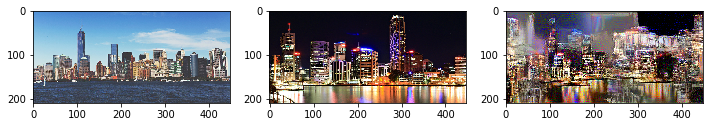

In [25]:
im_content = load_image2("data/city/7.jpg", width=448).astype("float32")
im_style = load_image2("data/city/5.jpg", height=im_content.shape[0], width=im_content.shape[1]).astype("float32")
reset()

with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_2"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 1000, 0.8, K=4, orphan=True, normalize=True, use_dcrf=False, matting_loss=0, tv_loss=0, debug=True)

Computing 4 masks


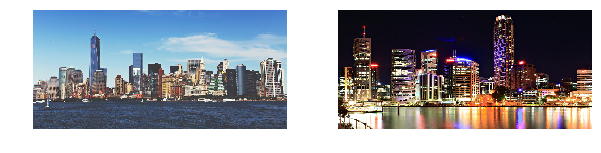

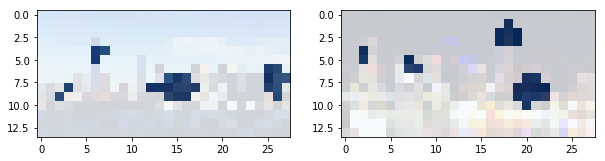

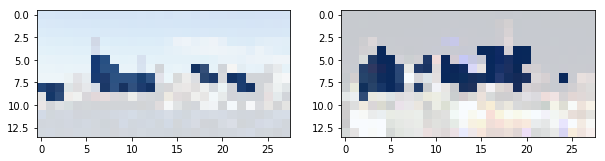

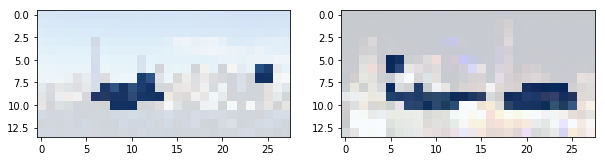

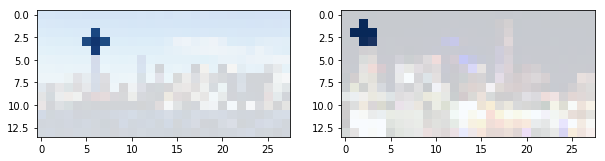

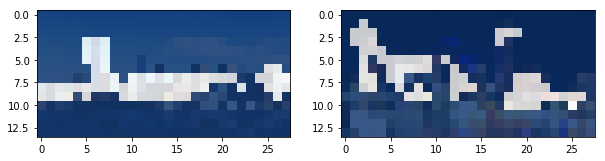

(1, 27, 56, 512)
Start Training
Iteration 0 / 1000
Content loss: 0.0
Style loss: 856418944.0
Affine loss: 37035.9765625
Tv loss: 2836739.0
Iteration 100 / 1000
Content loss: 329866.46875
Style loss: 15554558.0
Affine loss: 9276316.0
Tv loss: 5167912.0
Iteration 200 / 1000
Content loss: 357397.5625
Style loss: 12360764.0
Affine loss: 8132134.5
Tv loss: 4805093.0
Iteration 300 / 1000
Content loss: 363492.84375
Style loss: 11574300.0
Affine loss: 7781368.5
Tv loss: 4678936.0
Iteration 400 / 1000
Content loss: 366363.03125
Style loss: 11168400.0
Affine loss: 7625718.5
Tv loss: 4615622.0
Iteration 500 / 1000
Content loss: 368011.90625
Style loss: 10858237.0
Affine loss: 7523616.0
Tv loss: 4584853.5
Iteration 600 / 1000
Content loss: 369119.875
Style loss: 10632464.0
Affine loss: 7444219.0
Tv loss: 4558922.0
Iteration 700 / 1000
Content loss: 369945.6875
Style loss: 10464792.0
Affine loss: 7394156.5
Tv loss: 4533476.5
Iteration 800 / 1000
Content loss: 371099.71875
Style loss: 10290211.0
Aff

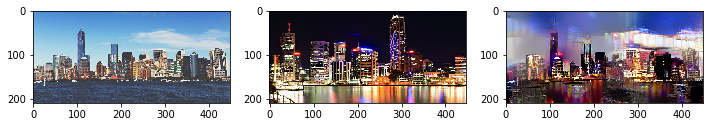

In [24]:
im_content = load_image2("data/city/7.jpg", width=448).astype("float32")
im_style = load_image2("data/city/5.jpg", height=im_content.shape[0], width=im_content.shape[1]).astype("float32")
reset()

with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_2"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 1000, 0.8, K=4, orphan=True, normalize=True, use_dcrf=False, matting_loss=1000000000, tv_loss=1000, debug=True)

Start Training
Iteration 0 / 2500
Content loss: 0.0
Style loss: 1152902016.0
Affine loss: [[ 45501.6640625]]
Iteration 100 / 2500
Content loss: 1399104.0
Style loss: 112663296.0
Affine loss: [[ 21947098.]]
Iteration 200 / 2500
Content loss: 1566179.125
Style loss: 73877336.0
Affine loss: [[ 19245476.]]
Iteration 300 / 2500
Content loss: 1634267.125
Style loss: 60427380.0
Affine loss: [[ 16629741.]]
Iteration 400 / 2500
Content loss: 1677029.0
Style loss: 52465968.0
Affine loss: [[ 15119562.]]
Iteration 500 / 2500
Content loss: 1707685.0
Style loss: 44560948.0
Affine loss: [[ 13637580.]]
Iteration 600 / 2500
Content loss: 1719847.75
Style loss: 39985612.0
Affine loss: [[ 12753989.]]
Iteration 700 / 2500
Content loss: 1736733.5
Style loss: 36126972.0
Affine loss: [[ 11962521.]]
Iteration 800 / 2500
Content loss: 1753367.5
Style loss: 31846616.0
Affine loss: [[ 10943926.]]
Iteration 900 / 2500
Content loss: 1763578.0
Style loss: 30074736.0
Affine loss: [[ 10265671.]]
Iteration 1000 / 2500

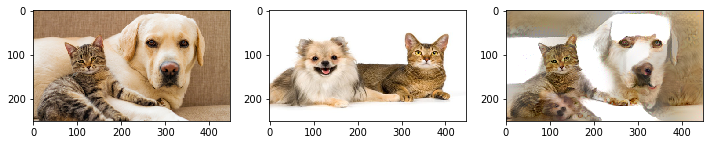

In [17]:
im_content = load_image2("data/catndogs/1.jpg", width=448)
im_style = load_image2("data/catndogs/2.jpg", height=im_content.shape[0], width=im_content.shape[1])

tf.reset_default_graph()
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.4

with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_1"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 2500, 1e-5, K=0,
                                 normalize=True, orphan=False, debug=True, use_dcrf=False, matting_loss=1000000000)


Start Training
Iteration 0 / 1500
Content loss: 0.0
Style loss: 1152901888.0
Affine loss: [[ 0.]]
Iteration 100 / 1500
Content loss: 1532988.125
Style loss: 102148000.0
Affine loss: [[ 0.]]
Iteration 200 / 1500
Content loss: 1727251.5
Style loss: 64213196.0
Affine loss: [[ 0.]]
Iteration 300 / 1500
Content loss: 1812805.125
Style loss: 51913664.0
Affine loss: [[ 0.]]
Iteration 400 / 1500
Content loss: 1871390.625
Style loss: 44915400.0
Affine loss: [[ 0.]]
Iteration 500 / 1500
Content loss: 1914486.375
Style loss: 39701940.0
Affine loss: [[ 0.]]
Iteration 600 / 1500
Content loss: 1951034.375
Style loss: 35450596.0
Affine loss: [[ 0.]]
Iteration 700 / 1500
Content loss: 1976333.0
Style loss: 31320184.0
Affine loss: [[ 0.]]
Iteration 800 / 1500
Content loss: 1986205.75
Style loss: 28825016.0
Affine loss: [[ 0.]]
Iteration 900 / 1500
Content loss: 1991659.5
Style loss: 27433188.0
Affine loss: [[ 0.]]
Iteration 1000 / 1500
Content loss: 2009161.875
Style loss: 25626494.0
Affine loss: [[ 0.

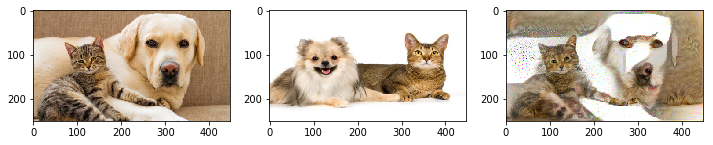

In [20]:
im_content = load_image2("data/catndogs/1.jpg", width=448)
im_style = load_image2("data/catndogs/2.jpg", height=im_content.shape[0], width=im_content.shape[1])

tf.reset_default_graph()
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.4

with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_1"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 1500, 1e-5, K=0,
                                 normalize=True, orphan=False, debug=True, use_dcrf=False, matting_loss=0)


Start Training
Iteration 0 / 1500
Content loss: 0.0
Style loss: 8165670400.0
Affine loss: [[ 0.]]
Iteration 100 / 1500
Content loss: 5351693.0
Style loss: 15544573.0
Affine loss: [[ 0.]]
Iteration 200 / 1500
Content loss: 5489665.5
Style loss: 8076942.5
Affine loss: [[ 0.]]
Iteration 300 / 1500
Content loss: 5506726.5
Style loss: 5736179.0
Affine loss: [[ 0.]]
Iteration 400 / 1500
Content loss: 5475404.5
Style loss: 4493362.5
Affine loss: [[ 0.]]
Iteration 500 / 1500
Content loss: 5441827.0
Style loss: 3754002.5
Affine loss: [[ 0.]]
Iteration 600 / 1500
Content loss: 5411006.0
Style loss: 3260808.75
Affine loss: [[ 0.]]
Iteration 700 / 1500
Content loss: 5378506.0
Style loss: 2896102.5
Affine loss: [[ 0.]]
Iteration 800 / 1500
Content loss: 5348470.0
Style loss: 2624351.25
Affine loss: [[ 0.]]
Iteration 900 / 1500
Content loss: 5320817.0
Style loss: 2419522.5
Affine loss: [[ 0.]]
Iteration 1000 / 1500
Content loss: 5295881.0
Style loss: 2255443.75
Affine loss: [[ 0.]]
Iteration 1100 / 

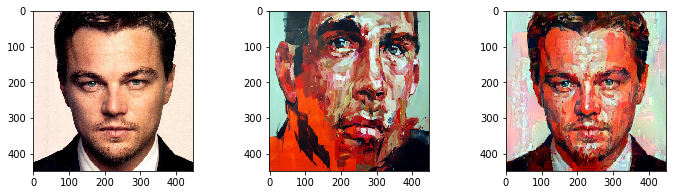

In [23]:
im_content = load_image2("data/face/6.jpg", width=448)
im_style = load_image2("data/face/10.jpg", height=im_content.shape[0], width=im_content.shape[1])

tf.reset_default_graph()
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.4

with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_1"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 1500, 1e-5, K=0,
                                 normalize=True, orphan=False, debug=True, use_dcrf=False, matting_loss=0)


Start Training
Iteration 0 / 1500
Content loss: 0.0
Style loss: 8165671424.0
Affine loss: [[ 81461.78125]]
Iteration 100 / 1500
Content loss: 4954823.5
Style loss: 18318146.0
Affine loss: [[ 13374700.]]
Iteration 200 / 1500
Content loss: 5070521.5
Style loss: 10876565.0
Affine loss: [[ 8870398.]]
Iteration 300 / 1500
Content loss: 5107428.0
Style loss: 8540351.0
Affine loss: [[ 7143265.5]]
Iteration 400 / 1500
Content loss: 5136256.0
Style loss: 7125701.0
Affine loss: [[ 6221507.5]]
Iteration 500 / 1500
Content loss: 5145616.0
Style loss: 6470926.5
Affine loss: [[ 5674297.]]
Iteration 600 / 1500
Content loss: 5161083.0
Style loss: 5884181.0
Affine loss: [[ 5306233.]]
Iteration 700 / 1500
Content loss: 5170051.5
Style loss: 5487565.5
Affine loss: [[ 5058892.]]
Iteration 800 / 1500
Content loss: 5172308.5
Style loss: 5196644.5
Affine loss: [[ 4876625.5]]
Iteration 900 / 1500
Content loss: 5173280.5
Style loss: 4953904.0
Affine loss: [[ 4738752.5]]
Iteration 1000 / 1500
Content loss: 5177

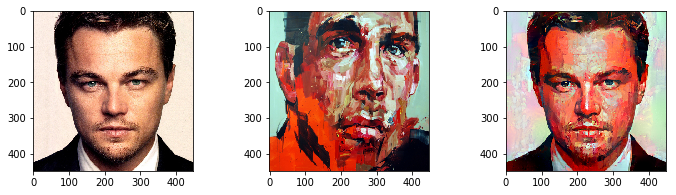

In [22]:
im_content = load_image2("data/face/6.jpg", width=448)
im_style = load_image2("data/face/10.jpg", height=im_content.shape[0], width=im_content.shape[1])

tf.reset_default_graph()
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.4

with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_1"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 1500, 1e-5, K=0,
                                 normalize=True, orphan=False, debug=True, use_dcrf=False, matting_loss=1000000000)


(1, 52, 75, 512)
Start Training
Iteration 0 / 700
Content loss: 0.0
Style loss: 8994998272.0
Affine loss: [[ 0.]]
Iteration 100 / 700
Content loss: 184099.28125
Style loss: 32507588.0
Affine loss: [[ 0.]]
Iteration 200 / 700
Content loss: 197084.625
Style loss: 15674117.0
Affine loss: [[ 0.]]
Iteration 300 / 700
Content loss: 203164.78125
Style loss: 10574781.0
Affine loss: [[ 0.]]
Iteration 400 / 700
Content loss: 206795.09375
Style loss: 7964693.5
Affine loss: [[ 0.]]
Iteration 500 / 700
Content loss: 209479.609375
Style loss: 6416633.5
Affine loss: [[ 0.]]
Iteration 600 / 700
Content loss: 211715.484375
Style loss: 5292041.0
Affine loss: [[ 0.]]
Iteration 700 / 700
Content loss: 213433.859375
Style loss: 4469061.5
Affine loss: [[ 0.]]
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
  Objective function value: 4653318.000000
  Number of iterations: 701
  Number of functions evaluations: 705


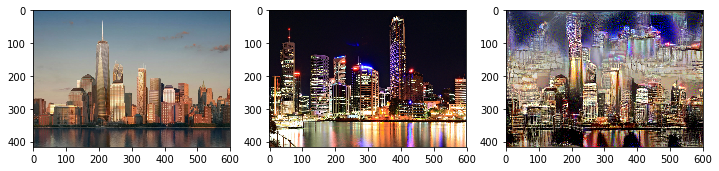

In [60]:
im_content = load_image2("data/city/11.jpg", width=600)
im_style = load_image2("data/city/5.jpg", height=im_content.shape[0], width=im_content.shape[1])

reset()
init_image = np.random.randn(im_content.shape[0], im_content.shape[1], 3).astype(np.float32) * 0.0001
with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_2"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 700, 0.5, K=0,
                                 normalize=True, orphan=False, debug=True, use_dcrf=False, matting_loss=0)


Computing 10 masks


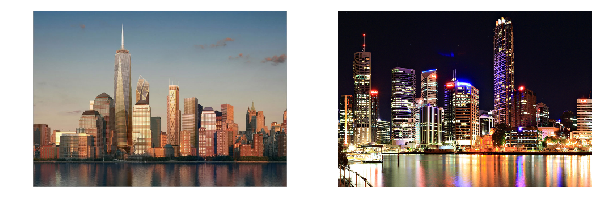

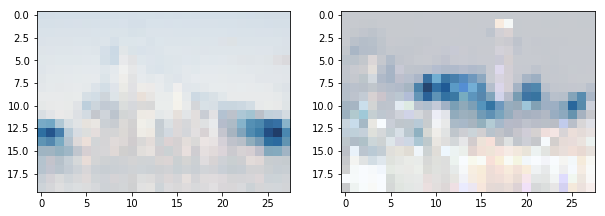

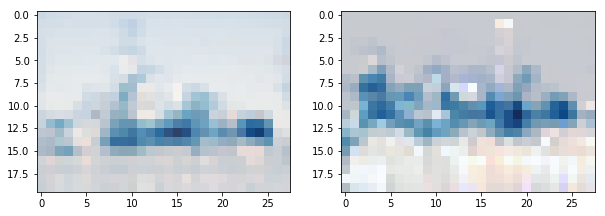

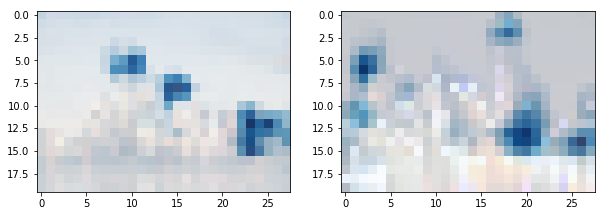

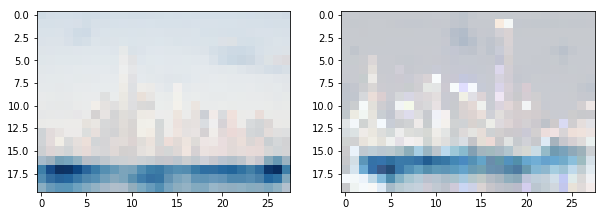

...

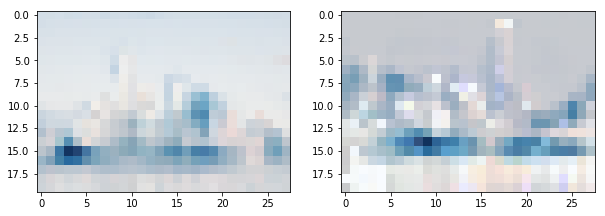

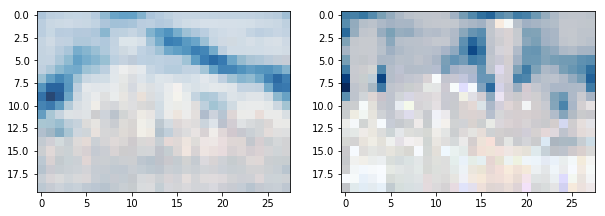

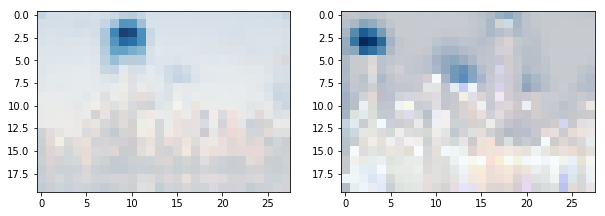

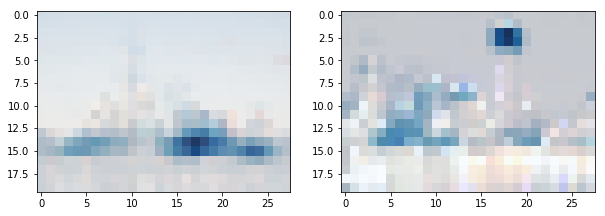

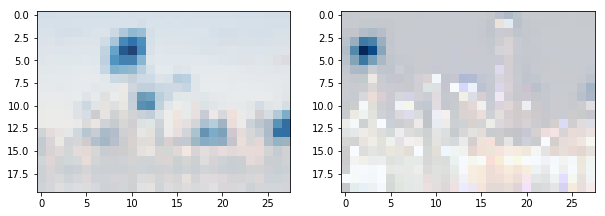

(1, 39, 56, 512)
Start Training
Iteration 0 / 700
Content loss: 0.0
Style loss: 47674340.0
Affine loss: [[ 0.]]
Iteration 100 / 700
Content loss: 184284.21875
Style loss: 1246388.0
Affine loss: [[ 0.]]
Iteration 200 / 700
Content loss: 190874.09375
Style loss: 1002938.3125
Affine loss: [[ 0.]]
Iteration 300 / 700
Content loss: 193171.015625
Style loss: 910259.3125
Affine loss: [[ 0.]]
Iteration 400 / 700
Content loss: 194252.15625
Style loss: 860110.9375
Affine loss: [[ 0.]]
Iteration 500 / 700
Content loss: 194540.0
Style loss: 829476.6875
Affine loss: [[ 0.]]
Iteration 600 / 700
Content loss: 194455.84375
Style loss: 809069.9375
Affine loss: [[ 0.]]
Iteration 700 / 700
Content loss: 194393.609375
Style loss: 794015.375
Affine loss: [[ 0.]]
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
  Objective function value: 988148.750000
  Number of iterations: 701
  Number of functions evaluations: 703


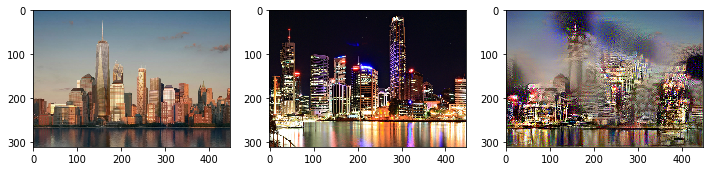

In [10]:
im_content = load_image2("data/city/11.jpg", width=448)
im_style = load_image2("data/city/5.jpg", height=im_content.shape[0], width=im_content.shape[1])

reset()
init_image = np.random.randn(im_content.shape[0], im_content.shape[1], 3).astype(np.float32) * 0.0001
with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_2"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 700, 0.5, K=10,
                                 normalize=True, orphan=False, debug=True, use_dcrf=False, matting_loss=0)


# threshold

Computing 10 masks


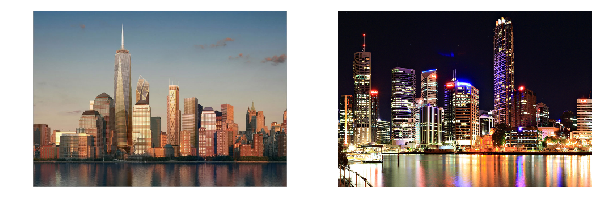

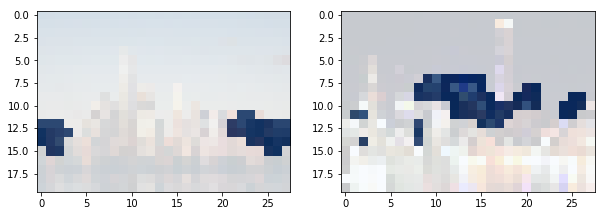

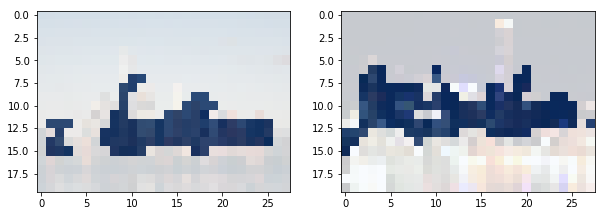

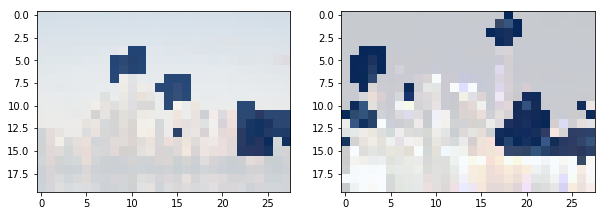

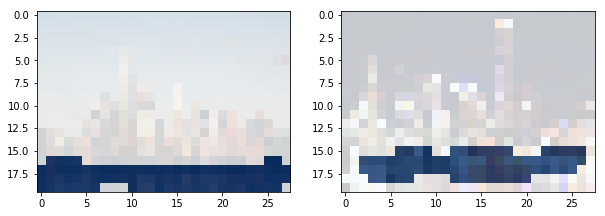

...

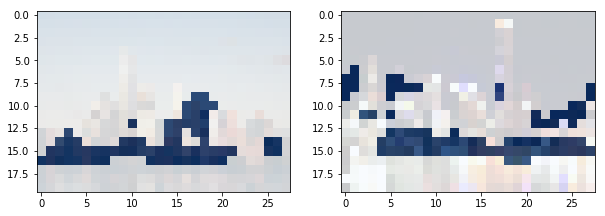

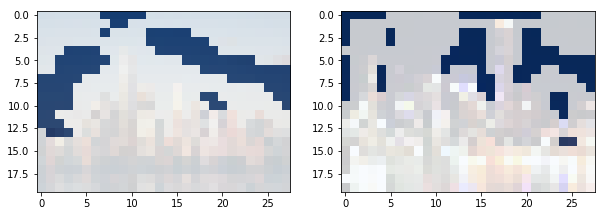

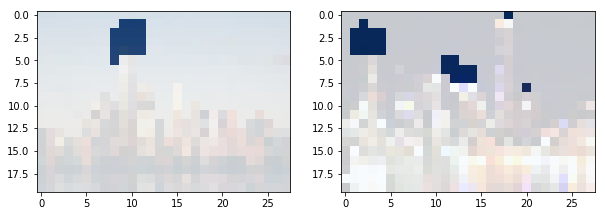

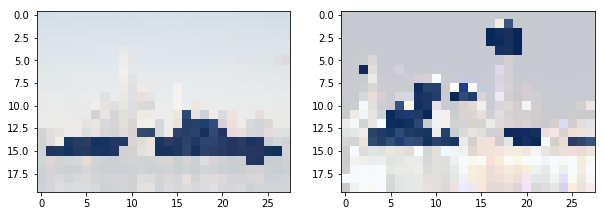

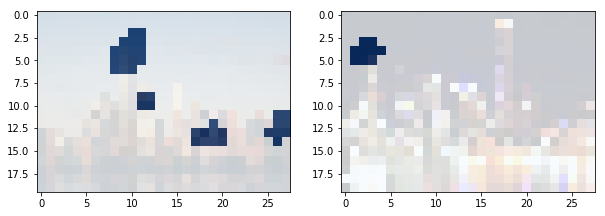

(1, 39, 56, 512)
Start Training
Iteration 0 / 700
Content loss: 0.0
Style loss: 403697344.0
Affine loss: [[ 0.]]
Iteration 100 / 700
Content loss: 290459.5625
Style loss: 10473825.0
Affine loss: [[ 0.]]
Iteration 200 / 700
Content loss: 308232.40625
Style loss: 8048753.5
Affine loss: [[ 0.]]
Iteration 300 / 700
Content loss: 313180.375
Style loss: 7244250.5
Affine loss: [[ 0.]]
Iteration 400 / 700
Content loss: 316022.21875
Style loss: 6802437.0
Affine loss: [[ 0.]]
Iteration 500 / 700
Content loss: 318110.09375
Style loss: 6533594.0
Affine loss: [[ 0.]]
Iteration 600 / 700
Content loss: 319553.5625
Style loss: 6362723.5
Affine loss: [[ 0.]]
Iteration 700 / 700
Content loss: 320863.09375
Style loss: 6237982.0
Affine loss: [[ 0.]]
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
  Objective function value: 6556964.000000
  Number of iterations: 701
  Number of functions evaluations: 703


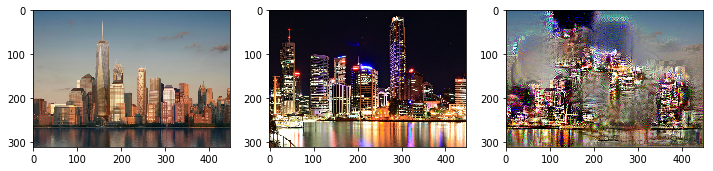

In [11]:
im_content = load_image2("data/city/11.jpg", width=448)
im_style = load_image2("data/city/5.jpg", height=im_content.shape[0], width=im_content.shape[1])

reset()
init_image = np.random.randn(im_content.shape[0], im_content.shape[1], 3).astype(np.float32) * 0.0001
with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_2"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 700, 0.5, K=10,
                                 normalize=True, orphan=False, debug=True, use_dcrf=False, matting_loss=0)


Computing 1 masks


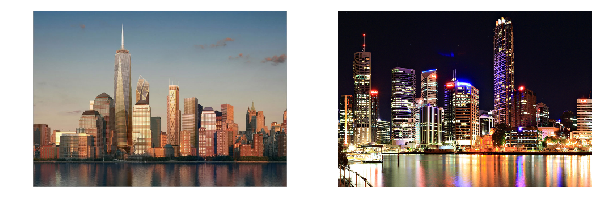

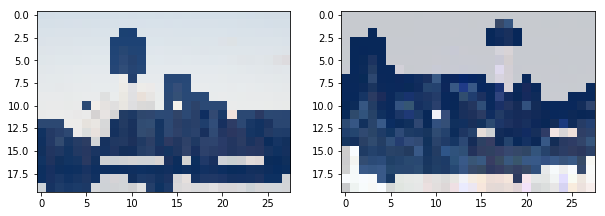

(1, 39, 56, 512)
Start Training
Iteration 0 / 700
Content loss: 0.0
Style loss: 6672550400.0
Affine loss: [[ 0.]]
Iteration 100 / 700
Content loss: 179727.390625
Style loss: 14193837.0
Affine loss: [[ 0.]]
Iteration 200 / 700
Content loss: 196464.25
Style loss: 7552349.0
Affine loss: [[ 0.]]
Iteration 300 / 700
Content loss: 204816.25
Style loss: 5431494.5
Affine loss: [[ 0.]]
Iteration 400 / 700
Content loss: 210392.5625
Style loss: 4407156.0
Affine loss: [[ 0.]]
Iteration 500 / 700
Content loss: 214364.734375
Style loss: 3773461.75
Affine loss: [[ 0.]]
Iteration 600 / 700
Content loss: 216932.484375
Style loss: 3376708.0
Affine loss: [[ 0.]]
Iteration 700 / 700
Content loss: 219055.78125
Style loss: 3095182.5
Affine loss: [[ 0.]]
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
  Objective function value: 3276700.750000
  Number of iterations: 701
  Number of functions evaluations: 717


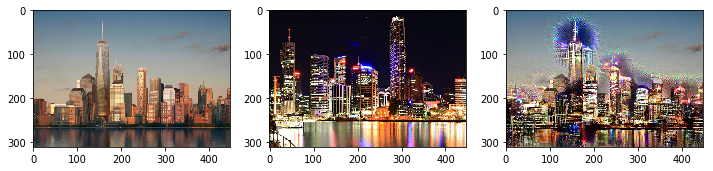

In [12]:
im_content = load_image2("data/city/11.jpg", width=448)
im_style = load_image2("data/city/5.jpg", height=im_content.shape[0], width=im_content.shape[1])

reset()
init_image = np.random.randn(im_content.shape[0], im_content.shape[1], 3).astype(np.float32) * 0.0001
with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_2"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 700, 0.5, K=1,
                                 normalize=True, orphan=True, debug=True, use_dcrf=False, matting_loss=0)


Computing 1 masks


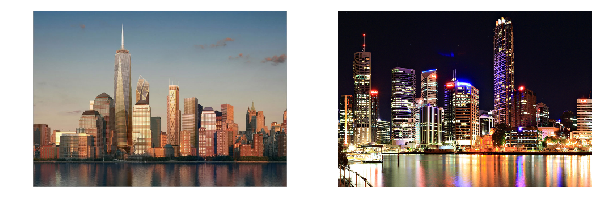

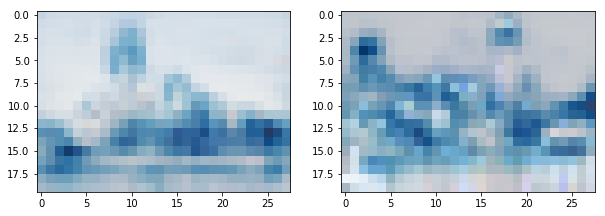

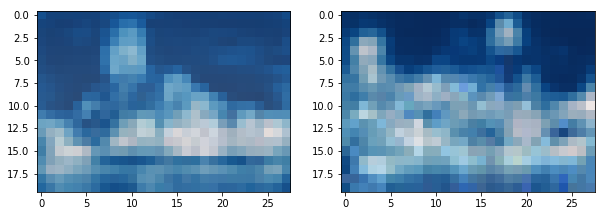

(1, 39, 56, 512)
Start Training
Iteration 0 / 400
Content loss: 0.0
Style loss: 1858754816.0
Affine loss: [[ 0.]]
Iteration 100 / 400
Content loss: 187831.65625
Style loss: 18011238.0
Affine loss: [[ 0.]]
Iteration 200 / 400
Content loss: 197577.078125
Style loss: 10596540.0
Affine loss: [[ 0.]]
Iteration 300 / 400
Content loss: 202423.5
Style loss: 7424874.5
Affine loss: [[ 0.]]
Iteration 400 / 400
Content loss: 205423.0625
Style loss: 5527211.0
Affine loss: [[ 0.]]
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
  Objective function value: 5704551.500000
  Number of iterations: 401
  Number of functions evaluations: 403


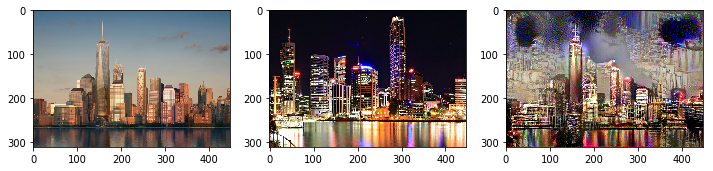

In [14]:
im_content = load_image2("data/city/11.jpg", width=448)
im_style = load_image2("data/city/5.jpg", height=im_content.shape[0], width=im_content.shape[1])

reset()
init_image = np.random.randn(im_content.shape[0], im_content.shape[1], 3).astype(np.float32) * 0.0001
with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_2"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 400, 0.5, K=1,
                                 normalize=True, orphan=True, debug=True, use_dcrf=False, matting_loss=0)


Computing 1 masks


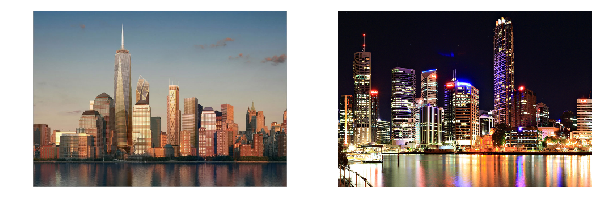

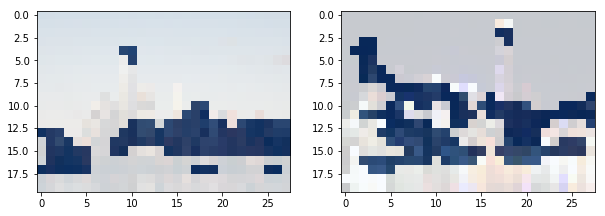

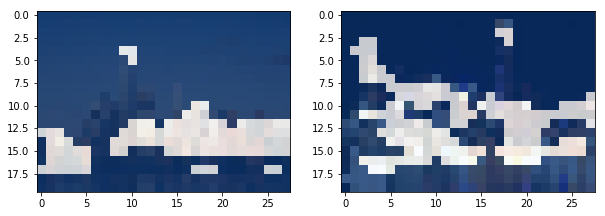

(1, 39, 56, 512)
Start Training
Iteration 0 / 400
Content loss: 0.0
Style loss: 5871755776.0
Affine loss: [[ 0.]]
Iteration 100 / 400
Content loss: 199764.65625
Style loss: 42775536.0
Affine loss: [[ 0.]]
Iteration 200 / 400
Content loss: 214653.359375
Style loss: 22869626.0
Affine loss: [[ 0.]]
Iteration 300 / 400
Content loss: 222443.796875
Style loss: 15966351.0
Affine loss: [[ 0.]]
Iteration 400 / 400
Content loss: 227575.375
Style loss: 12216987.0
Affine loss: [[ 0.]]
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
  Objective function value: 12254478.000000
  Number of iterations: 401
  Number of functions evaluations: 407


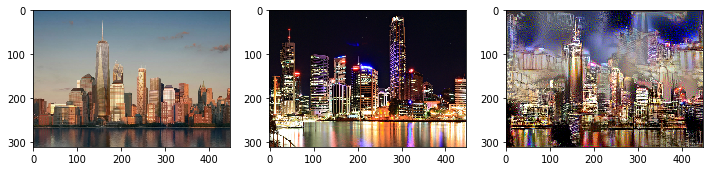

In [16]:
im_content = load_image2("data/city/11.jpg", width=448)
im_style = load_image2("data/city/5.jpg", height=im_content.shape[0], width=im_content.shape[1])

reset()
init_image = np.random.randn(im_content.shape[0], im_content.shape[1], 3).astype(np.float32) * 0.0001
with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_2"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 400, 0.5, K=1,
                                 normalize=True, orphan=True, debug=True, use_dcrf=False, matting_loss=0)


Computing 1 masks


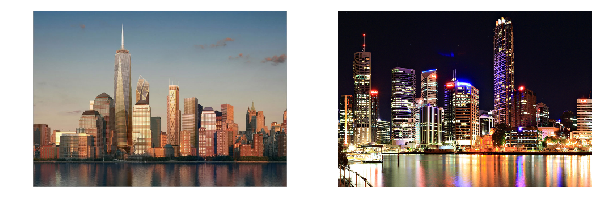

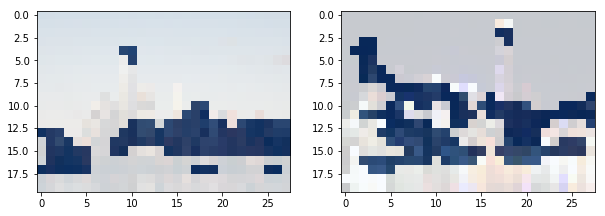

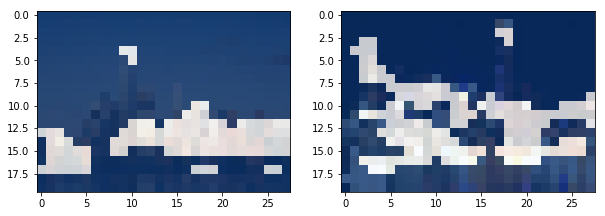

(1, 39, 56, 512)
Start Training
Iteration 0 / 400
Content loss: 0.0
Style loss: 5871756288.0
Affine loss: [[ 447.66921997]]
Iteration 100 / 400
Content loss: 200358.375
Style loss: 41103284.0
Affine loss: [[ 2510585.25]]
Iteration 200 / 400
Content loss: 214048.5625
Style loss: 22123930.0
Affine loss: [[ 2690585.]]
Iteration 300 / 400
Content loss: 221173.828125
Style loss: 15679829.0
Affine loss: [[ 2585845.5]]
Iteration 400 / 400
Content loss: 225243.390625
Style loss: 12415238.0
Affine loss: [[ 2433542.25]]
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
  Objective function value: 15016391.000000
  Number of iterations: 401
  Number of functions evaluations: 403


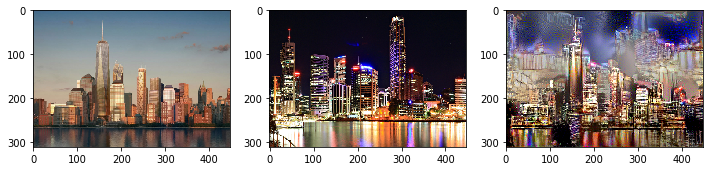

In [18]:
im_content = load_image2("data/city/11.jpg", width=448)
im_style = load_image2("data/city/5.jpg", height=im_content.shape[0], width=im_content.shape[1])

reset()
init_image = np.random.randn(im_content.shape[0], im_content.shape[1], 3).astype(np.float32) * 0.0001
with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_2"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 400, 0.5, K=1,
                                 normalize=True, orphan=True, debug=True, use_dcrf=False, matting_loss=10000000)


Computing 1 masks


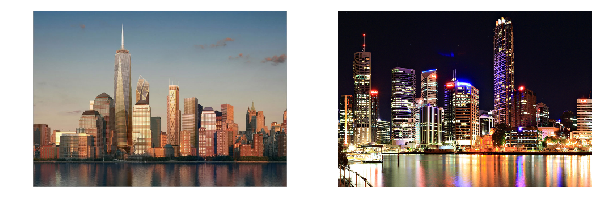

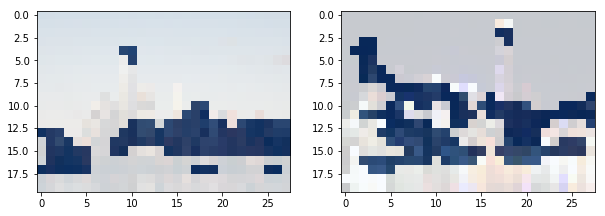

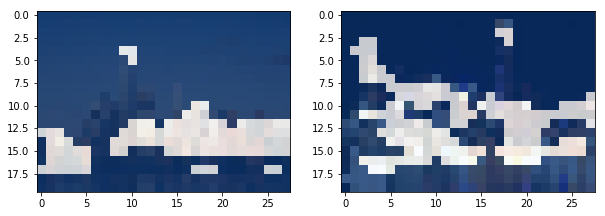

(1, 39, 56, 512)
Start Training
Iteration 0 / 400
Content loss: 0.0
Style loss: 5871756800.0
Affine loss: [[ 447683.9375]]
Iteration 100 / 400
Content loss: 154090.375
Style loss: 90324672.0
Affine loss: [[ 71828712.]]
Iteration 200 / 400
Content loss: 164211.0625
Style loss: 69337584.0
Affine loss: [[ 58745824.]]
Iteration 300 / 400
Content loss: 167579.0
Style loss: 63489000.0
Affine loss: [[ 55782672.]]
Iteration 400 / 400
Content loss: 169460.390625
Style loss: 60568576.0
Affine loss: [[ 54407716.]]
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
  Objective function value: 115091912.000000
  Number of iterations: 401
  Number of functions evaluations: 403


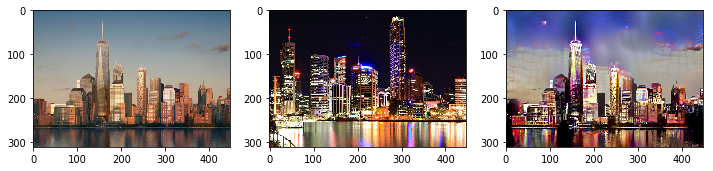

In [23]:
im_content = load_image2("data/city/11.jpg", width=448)
im_style = load_image2("data/city/5.jpg", height=im_content.shape[0], width=im_content.shape[1])

reset()
init_image = np.random.randn(im_content.shape[0], im_content.shape[1], 3).astype(np.float32) * 0.0001
with tf.Session(config=config) as sess:
    style_transfer.StyleTransfer(["conv4_2"], ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"], "conv5_4", im_content, im_content, im_style, sess, 400, 0.5, K=1,
                                 normalize=True, orphan=True, debug=True, use_dcrf=False, matting_loss=10000000000)
